## Flight Delay Prediction

In [1]:
# Importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
flights = pd.read_csv('flights.csv', low_memory = False)

In [3]:
flights.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,...,408.0,-22.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,...,741.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,...,811.0,5.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,...,756.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,...,259.0,-21.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
flights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5819079 entries, 0 to 5819078
Data columns (total 31 columns):
 #   Column               Dtype  
---  ------               -----  
 0   YEAR                 int64  
 1   MONTH                int64  
 2   DAY                  int64  
 3   DAY_OF_WEEK          int64  
 4   AIRLINE              object 
 5   FLIGHT_NUMBER        int64  
 6   TAIL_NUMBER          object 
 7   ORIGIN_AIRPORT       object 
 8   DESTINATION_AIRPORT  object 
 9   SCHEDULED_DEPARTURE  int64  
 10  DEPARTURE_TIME       float64
 11  DEPARTURE_DELAY      float64
 12  TAXI_OUT             float64
 13  WHEELS_OFF           float64
 14  SCHEDULED_TIME       float64
 15  ELAPSED_TIME         float64
 16  AIR_TIME             float64
 17  DISTANCE             int64  
 18  WHEELS_ON            float64
 19  TAXI_IN              float64
 20  SCHEDULED_ARRIVAL    int64  
 21  ARRIVAL_TIME         float64
 22  ARRIVAL_DELAY        float64
 23  DIVERTED             int64  
 24

In [5]:
flights_df = flights.loc[:99999, :]

In [6]:
flights_df.shape

(100000, 31)

In [7]:
flights_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   YEAR                 100000 non-null  int64  
 1   MONTH                100000 non-null  int64  
 2   DAY                  100000 non-null  int64  
 3   DAY_OF_WEEK          100000 non-null  int64  
 4   AIRLINE              100000 non-null  object 
 5   FLIGHT_NUMBER        100000 non-null  int64  
 6   TAIL_NUMBER          99833 non-null   object 
 7   ORIGIN_AIRPORT       100000 non-null  object 
 8   DESTINATION_AIRPORT  100000 non-null  object 
 9   SCHEDULED_DEPARTURE  100000 non-null  int64  
 10  DEPARTURE_TIME       97702 non-null   float64
 11  DEPARTURE_DELAY      97702 non-null   float64
 12  TAXI_OUT             97629 non-null   float64
 13  WHEELS_OFF           97629 non-null   float64
 14  SCHEDULED_TIME       100000 non-null  float64
 15  ELAPSED_TIME      

In [8]:
diverted = flights_df.DIVERTED.value_counts()

In [9]:
diverted

0    99776
1      224
Name: DIVERTED, dtype: int64

### Exploratory Data Analysis

In [10]:
flights_df_corr = flights_df.corr()

In [11]:
flights_df_corr

,YEAR,MONTH,DAY,DAY_OF_WEEK,FLIGHT_NUMBER,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,...,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
YEAR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MONTH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DAY,NaN,NaN,1.000000,-0.497084,0.004412,-0.138130,-0.124369,0.060064,0.093451,-0.119781,...,-0.110820,-0.091687,0.070770,0.004847,-0.006000,0.097693,-0.010550,-0.001603,0.033213,0.061960
DAY_OF_WEEK,NaN,NaN,-0.497084,1.000000,0.010955,0.046914,0.045182,0.055632,0.007291,0.044150,...,0.031725,0.011477,0.067520,-0.000709,-0.006409,-0.019626,0.008156,0.003648,0.033729,-0.050835
FLIGHT_NUMBER,NaN,NaN,0.004412,0.010955,1.000000,-0.003027,0.010140,0.034863,0.061010,0.016377,...,-0.018891,0.000753,0.056163,0.007155,0.090008,-0.032564,-0.007260,0.023770,0.076581,0.004246
SCHEDULED_DEPARTURE,NaN,NaN,-0.138130,0.046914,-0.003027,1.000000,0.943186,0.174254,-0.081496,0.912232,...,0.731240,0.552653,0.154951,0.002515,-0.002631,-0.112393,-0.017957,-0.054419,0.186286,-0.042004
DEPARTURE_TIME,NaN,NaN,-0.124369,0.045182,0.010140,0.943186,1.000000,0.243960,-0.070081,0.966477,...,0.734970,0.584615,0.223654,0.006576,0.009679,-0.093096,-0.012820,-0.013304,0.247325,-0.046406
DEPARTURE_DELAY,NaN,NaN,0.060064,0.055632,0.034863,0.174254,0.243960,1.000000,0.061905,0.231399,...,0.155150,0.079639,0.950838,0.020787,0.030862,0.085794,0.008040,0.606954,0.605289,0.210402
TAXI_OUT,NaN,NaN,0.093451,0.007291,0.061010,-0.081496,-0.070081,0.061905,1.000000,-0.043114,...,-0.062325,-0.045611,0.245363,0.009810,0.010763,0.407371,-0.008021,-0.024674,-0.129879,0.119412
WHEELS_OFF,NaN,NaN,-0.119781,0.044150,0.016377,0.912232,0.966477,0.231399,-0.043114,1.000000,...,0.744697,0.608611,0.217344,0.006524,0.001293,-0.085582,-0.013912,-0.017376,0.223010,-0.055273


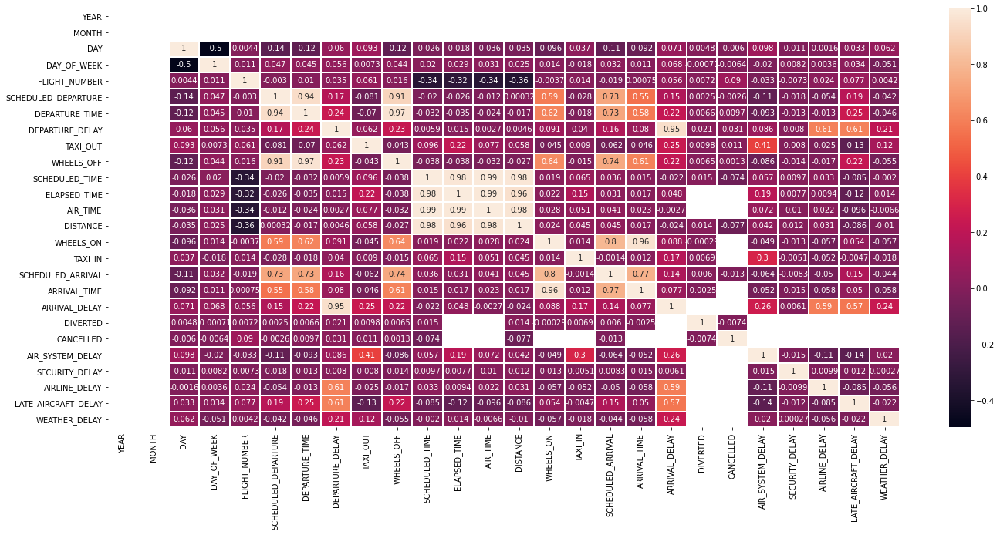

In [12]:
# heatmap of the data

fig, ax = plt.subplots(figsize = (23, 10))
sns.heatmap(flights_df.corr(), annot = True, annot_kws = {'size': 10}, linewidths = 1)
plt.show()

**From the above Heatmap we can see that "DEPARTURE_DELAY" shows perfect correlation "ARIVAL_dELAY" of 95%.** 

##### We can confirm the above conclusion by jointplot and pairplot

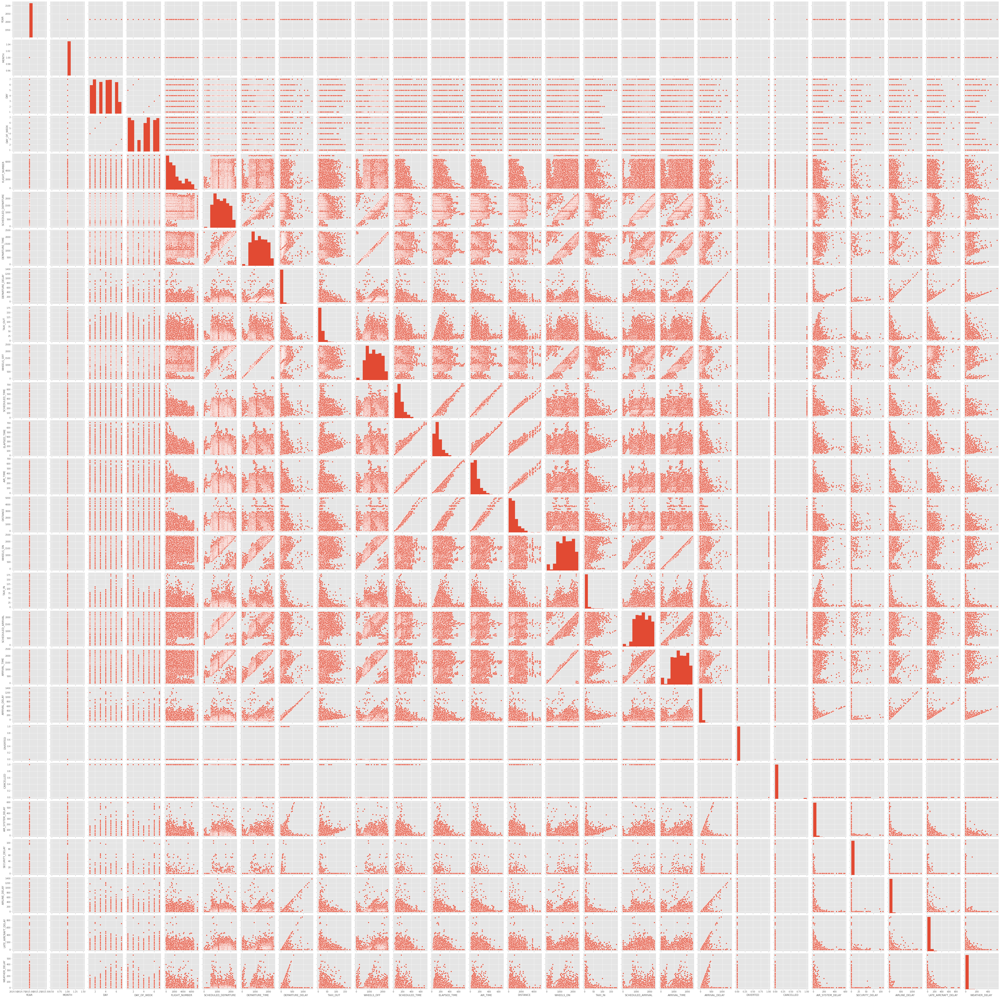

In [13]:
plt.style.use('ggplot')
sns.pairplot(flights_df)
plt.show()

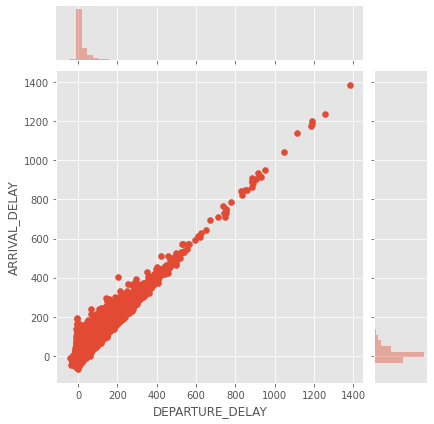

In [14]:
sns.jointplot(x = "DEPARTURE_DELAY", y = "ARRIVAL_DELAY", data = flights_df)
plt.show()

In [15]:
# Checking Null Values

flights_df.isnull().sum()

YEAR                       0
MONTH                      0
DAY                        0
DAY_OF_WEEK                0
AIRLINE                    0
FLIGHT_NUMBER              0
TAIL_NUMBER              167
ORIGIN_AIRPORT             0
DESTINATION_AIRPORT        0
SCHEDULED_DEPARTURE        0
DEPARTURE_TIME          2298
DEPARTURE_DELAY         2298
TAXI_OUT                2371
WHEELS_OFF              2371
SCHEDULED_TIME             0
ELAPSED_TIME            2613
AIR_TIME                2613
DISTANCE                   0
WHEELS_ON               2440
TAXI_IN                 2440
SCHEDULED_ARRIVAL          0
ARRIVAL_TIME            2440
ARRIVAL_DELAY           2613
DIVERTED                   0
CANCELLED                  0
CANCELLATION_REASON    97611
AIR_SYSTEM_DELAY       65375
SECURITY_DELAY         65375
AIRLINE_DELAY          65375
LATE_AIRCRAFT_DELAY    65375
WEATHER_DELAY          65375
dtype: int64

In [16]:
cols = ['YEAR', 'AIRLINE', 'FLIGHT_NUMBER', 'DAY_OF_WEEK', 'TAIL_NUMBER', 'DEPARTURE_TIME', 'SCHEDULED_TIME', 'TAXI_OUT',
       'WHEELS_OFF', 'ELAPSED_TIME', 'AIR_TIME', 'DISTANCE', 'WHEELS_ON', 'TAXI_IN', 'ARRIVAL_TIME', 'CANCELLATION_REASON']

In [17]:
# dropping columns
flights_df.drop(columns = cols, axis = 1, inplace = True, errors = 'ignore')

In [18]:
flights_df.head()

,MONTH,DAY,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_DELAY,DIVERTED,CANCELLED,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,1,1,ANC,SEA,5,-11.0,430,-22.0,0,0,NaN,NaN,NaN,NaN,NaN
1,1,1,LAX,PBI,10,-8.0,750,-9.0,0,0,NaN,NaN,NaN,NaN,NaN
2,1,1,SFO,CLT,20,-2.0,806,5.0,0,0,NaN,NaN,NaN,NaN,NaN
3,1,1,LAX,MIA,20,-5.0,805,-9.0,0,0,NaN,NaN,NaN,NaN,NaN
4,1,1,SEA,ANC,25,-1.0,320,-21.0,0,0,NaN,NaN,NaN,NaN,NaN


In [19]:
flights_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   MONTH                100000 non-null  int64  
 1   DAY                  100000 non-null  int64  
 2   ORIGIN_AIRPORT       100000 non-null  object 
 3   DESTINATION_AIRPORT  100000 non-null  object 
 4   SCHEDULED_DEPARTURE  100000 non-null  int64  
 5   DEPARTURE_DELAY      97702 non-null   float64
 6   SCHEDULED_ARRIVAL    100000 non-null  int64  
 7   ARRIVAL_DELAY        97387 non-null   float64
 8   DIVERTED             100000 non-null  int64  
 9   CANCELLED            100000 non-null  int64  
 10  AIR_SYSTEM_DELAY     34625 non-null   float64
 11  SECURITY_DELAY       34625 non-null   float64
 12  AIRLINE_DELAY        34625 non-null   float64
 13  LATE_AIRCRAFT_DELAY  34625 non-null   float64
 14  WEATHER_DELAY        34625 non-null   float64
dtypes: float64(7), int

In [20]:
# checking null values

flights_df.isnull().sum()

MONTH                      0
DAY                        0
ORIGIN_AIRPORT             0
DESTINATION_AIRPORT        0
SCHEDULED_DEPARTURE        0
DEPARTURE_DELAY         2298
SCHEDULED_ARRIVAL          0
ARRIVAL_DELAY           2613
DIVERTED                   0
CANCELLED                  0
AIR_SYSTEM_DELAY       65375
SECURITY_DELAY         65375
AIRLINE_DELAY          65375
LATE_AIRCRAFT_DELAY    65375
WEATHER_DELAY          65375
dtype: int64

In [21]:
# filling null values

flights_df['DEPARTURE_DELAY'] = flights_df['DEPARTURE_DELAY'].fillna(flights_df['DEPARTURE_DELAY'].mean())
flights_df['ARRIVAL_DELAY'] = flights_df['ARRIVAL_DELAY'].fillna(flights_df['ARRIVAL_DELAY'].mean())
flights_df['AIR_SYSTEM_DELAY'] = flights_df['AIR_SYSTEM_DELAY'].fillna(flights_df['AIR_SYSTEM_DELAY'].mean())
flights_df['SECURITY_DELAY'] = flights_df['SECURITY_DELAY'].fillna(flights_df['SECURITY_DELAY'].mean())
flights_df['AIRLINE_DELAY'] = flights_df['AIRLINE_DELAY'].fillna(flights_df['AIRLINE_DELAY'].mean())
flights_df['LATE_AIRCRAFT_DELAY'] = flights_df['LATE_AIRCRAFT_DELAY'].fillna(flights_df['LATE_AIRCRAFT_DELAY'].mean())
flights_df['WEATHER_DELAY'] = flights_df['WEATHER_DELAY'].fillna(flights_df['WEATHER_DELAY'].mean())

In [22]:
flights_df.isnull().sum()

MONTH                  0
DAY                    0
ORIGIN_AIRPORT         0
DESTINATION_AIRPORT    0
SCHEDULED_DEPARTURE    0
DEPARTURE_DELAY        0
SCHEDULED_ARRIVAL      0
ARRIVAL_DELAY          0
DIVERTED               0
CANCELLED              0
AIR_SYSTEM_DELAY       0
SECURITY_DELAY         0
AIRLINE_DELAY          0
LATE_AIRCRAFT_DELAY    0
WEATHER_DELAY          0
dtype: int64

In [23]:
flights_df['result'] = 0
flights_df.loc[flights_df['ARRIVAL_DELAY'] > 15 , 'result'] = 1
flights_df.head()

,MONTH,DAY,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_DELAY,DIVERTED,CANCELLED,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,result
0,1,1,ANC,SEA,5,-11.0,430,-22.0,0,0,14.026801,0.070787,17.853921,26.014556,2.751971,0
1,1,1,LAX,PBI,10,-8.0,750,-9.0,0,0,14.026801,0.070787,17.853921,26.014556,2.751971,0
2,1,1,SFO,CLT,20,-2.0,806,5.0,0,0,14.026801,0.070787,17.853921,26.014556,2.751971,0
3,1,1,LAX,MIA,20,-5.0,805,-9.0,0,0,14.026801,0.070787,17.853921,26.014556,2.751971,0
4,1,1,SEA,ANC,25,-1.0,320,-21.0,0,0,14.026801,0.070787,17.853921,26.014556,2.751971,0


In [24]:
# calculating number of flight delayed 

flights_df['result'].value_counts()

0    63779
1    36221
Name: result, dtype: int64

In [25]:
flights_df.columns

Index(['MONTH', 'DAY', 'ORIGIN_AIRPORT', 'DESTINATION_AIRPORT',
       'SCHEDULED_DEPARTURE', 'DEPARTURE_DELAY', 'SCHEDULED_ARRIVAL',
       'ARRIVAL_DELAY', 'DIVERTED', 'CANCELLED', 'AIR_SYSTEM_DELAY',
       'SECURITY_DELAY', 'AIRLINE_DELAY', 'LATE_AIRCRAFT_DELAY',
       'WEATHER_DELAY', 'result'],
      dtype='object')

In [26]:
# dropping unnecessary column

flights_df.drop(['ORIGIN_AIRPORT', 'DESTINATION_AIRPORT', 'ARRIVAL_DELAY'], axis = 1, inplace = True, errors = 'ignore')

In [27]:
flights_df.columns

Index(['MONTH', 'DAY', 'SCHEDULED_DEPARTURE', 'DEPARTURE_DELAY',
       'SCHEDULED_ARRIVAL', 'DIVERTED', 'CANCELLED', 'AIR_SYSTEM_DELAY',
       'SECURITY_DELAY', 'AIRLINE_DELAY', 'LATE_AIRCRAFT_DELAY',
       'WEATHER_DELAY', 'result'],
      dtype='object')

In [28]:
X = flights_df.iloc[:, :-1].values
y = flights_df.iloc[:, -1].values

In [29]:
X

array([[1.00000000e+00, 1.00000000e+00, 5.00000000e+00, ...,
        1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
       [1.00000000e+00, 1.00000000e+00, 1.00000000e+01, ...,
        1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
       [1.00000000e+00, 1.00000000e+00, 2.00000000e+01, ...,
        1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
       ...,
       [1.00000000e+00, 7.00000000e+00, 1.10800000e+03, ...,
        1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
       [1.00000000e+00, 7.00000000e+00, 1.10900000e+03, ...,
        1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
       [1.00000000e+00, 7.00000000e+00, 1.10900000e+03, ...,
        1.78539206e+01, 2.60145560e+01, 2.75197112e+00]])

In [30]:
y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [31]:
X.shape, y.shape

((100000, 12), (100000,))

In [32]:
# splitting the dataset into training and testing data

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [33]:
X_train, X_test

(array([[1.00000000e+00, 5.00000000e+00, 1.90500000e+03, ...,
         3.00000000e+00, 4.90000000e+01, 0.00000000e+00],
        [1.00000000e+00, 4.00000000e+00, 1.94500000e+03, ...,
         1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
        [1.00000000e+00, 2.00000000e+00, 1.82200000e+03, ...,
         1.60000000e+01, 0.00000000e+00, 0.00000000e+00],
        ...,
        [1.00000000e+00, 5.00000000e+00, 1.92900000e+03, ...,
         1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
        [1.00000000e+00, 1.00000000e+00, 7.00000000e+02, ...,
         0.00000000e+00, 3.06000000e+02, 0.00000000e+00],
        [1.00000000e+00, 2.00000000e+00, 7.05000000e+02, ...,
         1.78539206e+01, 2.60145560e+01, 2.75197112e+00]]),
 array([[1.00000000e+00, 5.00000000e+00, 1.81500000e+03, ...,
         1.80000000e+01, 2.23000000e+02, 0.00000000e+00],
        [1.00000000e+00, 6.00000000e+00, 6.35000000e+02, ...,
         1.78539206e+01, 2.60145560e+01, 2.75197112e+00],
        [1.00000000e+00, 

In [34]:
y_train, y_test

(array([1, 0, 1, ..., 0, 1, 0], dtype=int64),
 array([1, 0, 0, ..., 0, 0, 1], dtype=int64))

In [35]:
X_train.shape, X_test.shape

((70000, 12), (30000, 12))

In [36]:
y_train.shape, y_test.shape

((70000,), (30000,))

In [37]:
# Scaling the data
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [38]:
X_train, X_test

(array([[ 0.00000000e+00,  6.96272579e-01,  1.24047415e+00, ...,
         -5.82894753e-01,  9.04472471e-01, -2.70130898e-01],
        [ 0.00000000e+00,  1.45797308e-01,  1.32335243e+00, ...,
          4.57903688e-05, -3.07341225e-03, -5.55452065e-04],
        [ 0.00000000e+00, -9.55153235e-01,  1.06850172e+00, ...,
         -7.27111268e-02, -1.03021925e+00, -2.70130898e-01],
        ...,
        [ 0.00000000e+00,  6.96272579e-01,  1.29020112e+00, ...,
          4.57903688e-05, -3.07341225e-03, -5.55452065e-04],
        [ 0.00000000e+00, -1.50562851e+00, -1.25623399e+00, ...,
         -7.00629436e-01,  1.10517331e+01, -2.70130898e-01],
        [ 0.00000000e+00, -9.55153235e-01, -1.24587420e+00, ...,
          4.57903688e-05, -3.07341225e-03, -5.55452065e-04]]),
 array([[ 0.00000000e+00,  6.96272579e-01,  1.05399802e+00, ...,
          5.77866187e-03,  7.77460226e+00, -2.70130898e-01],
        [ 0.00000000e+00,  1.24674785e+00, -1.39091119e+00, ...,
          4.57903688e-05, -3.07341225e

In [39]:
X_train.shape, X_test.shape

((70000, 12), (30000, 12))

In [40]:
# fitting the data to the decision tree model

from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [41]:
y_pred = clf.predict(X_test)

In [42]:
y_pred

array([1, 0, 0, ..., 0, 0, 1], dtype=int64)

In [43]:
# comparing predictions with actual data set

comp = pd.DataFrame({"Actual Values": y_test, "Predicted Values": y_pred})
comp.head(15)

,Actual Values,Predicted Values
0,1,1
1,0,0
2,0,0
3,0,0
4,0,0
5,0,0
6,0,0
7,0,0
8,0,0
9,0,0


In [44]:
# calculating accurscy of model 

from sklearn.metrics import roc_auc_score

score = roc_auc_score(y_pred, y_test)

In [45]:
score

0.9982950511965926